# Objectif 

Date de création : 22/04/2026

Mise en œuvre d'un filtrage dans le plan (f, k) dans le but d'extraire les composantes de grandes longueurs d'onde du rapport de fonction de transfert. 

Il s'agit ici, après l'étude dans un guide d'onde idéal, de tester l'approche par filtrage dans en nombre d'onde sur un cas réel d'un passage de bateau passif. 


In [1]:
# %matplotlib ipympl
import os
import sys
import numpy as np
import xarray as xr
import scipy.signal as sp
import matplotlib.pyplot as plt

from scipy.fft import rfft, rfftfreq
from scipy.signal import find_peaks


sys.path.append(r"C:\Users\baptiste.menetrier\Desktop\devPy\phd")

# from propa.rtf.rtf_utils import D_hermitian_angle_fast
from real_data_analysis.fiberscope_groix.src.localisation.rtf.sensibility.simu.sensi_simu_utils import (
    run_full_study,
    compute_rtf_dataset,
    plot_intensity,
    plot_tl_pi_frequency_range_plan
)
import source.global_constants as g
from publication.publication_figure import (
    PubFigure,
    LargeFigure,
    SmallFigure,
    color,
    set_subfigures_abc_labels,
)


from real_data_analysis.fiberscope_groix.src.localisation.rtf.rtf_mfp import (
    RTF_MFP_Processor,
)
from misc import progression_bar

from real_data_analysis.fiberscope_groix.src.localisation.rtf.sensibility.sensibility_study_utils import *

In [2]:
# project_root = os.path.abspath(
#     os.path.join(os.path.dirname(os.getcwd()), "..", "..", "..", "..", "..")
# )
# root_groix_data = os.path.join(project_root, "data", "fiberscope_groix_oct_2025")
# root_groix_wav = os.path.join(root_groix_data, "wav")
# root_groix_metadata = os.path.join(root_groix_data, "metadata")

# root_folder = os.path.join(project_root, "real_data_analysis", "fiberscope_groix")
# data_folder = os.path.join(root_folder, "data")
# img_folder = os.path.join(root_folder, "img")

# sensibility_img_folder = os.path.join(img_folder, "rtf_mfp", "sensibility", "ideal_wg")

project_root = os.path.abspath(
    os.path.join(os.path.dirname(os.getcwd()), "..", "..", "..", "..", "..")
)
root_groix_data = os.path.join(project_root, "data", "fiberscope_groix_oct_2025")
root_groix_wav = os.path.join(root_groix_data, "wav")
root_groix_metadata = os.path.join(root_groix_data, "metadata")

root_folder = os.path.join(project_root, "real_data_analysis", "fiberscope_groix")
data_folder = os.path.join(root_folder, "data")
img_folder = os.path.join(root_folder, "img")

sensibility_img_folder = os.path.join(img_folder, "rtf_mfp", "sensibility")

In [3]:
sensibility_img_folder

'c:\\Users\\baptiste.menetrier\\Desktop\\devPy\\phd\\real_data_analysis\\fiberscope_groix\\img\\rtf_mfp\\sensibility'

# Étape 1 : chargement de la données 

In [4]:
# Load GPS dataset for station coordinates
ds_gps = xr.open_dataset(os.path.join(data_folder, "gps.nc"))

# Load arrivals dataset
fpath = os.path.join(
    data_folder,
    f"processed_arrivals.nc",
)
ds_arr = xr.open_dataset(fpath)
df_arr = ds_arr.to_dataframe()

## Calcul / chargement de la grandeur signante


In [5]:
root_data = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data"
root_img = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\img\rtf_mfp"
ref_rcv_id = 2
rtf_estimator = "cs-evd"

tau_ir_hat = 0.2  # estimated impulse response duration from sequence 144
tau_ir_hat *= 2  # To ensure we include the entire response


fsm_active_kwargs = {
    "bandfilter": None,
    "tau_ir": tau_ir_hat,
    "process_pulse_one_by_one": True,
    "estimate_ir_duration": False,
}
fsm_passive_kwargs = {
    "analysis_segment_duration": 5,
    "analysis_segment_alpha_overlap": 0.9,
}

fsm_props = {
    "fs": 2000,
    # "tau_rtf_analysis": 3,
    # "alpha_overlap": 0.5,
    # From the sensibility study below 
    "tau_rtf_analysis": 3.0,
    "alpha_overlap": 0.9,
}

rtf_mfp_processor = RTF_MFP_Processor(
    root_data=root_data,
    root_img=root_img,
    reference_receiver_id=ref_rcv_id,
    rtf_estimator=rtf_estimator,
    fsm_props=fsm_props,
    fsm_active_kwargs=fsm_active_kwargs,
    fsm_passive_kwargs=fsm_passive_kwargs,
    mode="overwrite",
    plot_replicas_features=False,
    verbose=True,
)

In [6]:
###########################
# Compute sequence replicas
###########################

id_library = 11
active_replicas_args = {
    "replica_sequence_ids": [],
    "replica_pulse_slice": [],
    "load_precomputed_feature": False,
}
passive_replicas_args = {
    "start_datetimes": [
        datetime(year=2025, month=10, day=15, hour=10, minute=14, second=00),  # OK
    ],
    "end_datetimes": [
        datetime(year=2025, month=10, day=15, hour=10, minute=18, second=00),  # OK
    ],
    "load_precomputed_feature": False,
}

rtf_mfp_processor.compute_library(
    active_feature_args=active_replicas_args,
    passive_feature_args=passive_replicas_args,
    id=id_library,
)


Deriving features for active source...

Deriving replicas for passive source...

RTF processing of passive recording
RTF feature estimation...
Progress: ████████████████████████████████████████████████████████████████████████████████████████████████████ 100%Using first vessel in list (default behavior) : mmsi=226916000
A library dataset with ID 11 already exists in C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\library. This library dataset will be overwritten.
Dataset (library) saved at C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\library\library_11.nc.


In [7]:
fpath = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\library\library_11.nc"
ds = xr.open_dataset(fpath)
ds

<xarray.Dataset> Size: 54MB
Dimensions:       (h_index: 3, f_rtf: 4097, replica_id: 470)
Coordinates:
  * h_index       (h_index) int64 24B 1 2 3
  * f_rtf         (f_rtf) float32 16kB 0.0 0.2441 0.4883 ... 999.5 999.8 1e+03
  * replica_id    (replica_id) int64 4kB 0 1 2 3 4 5 ... 464 465 466 467 468 469
Data variables:
    rtf_amp       (h_index, f_rtf, replica_id) float32 23MB ...
    rtf_phase     (h_index, f_rtf, replica_id) float32 23MB ...
    feature_psd   (f_rtf, replica_id) float32 8MB ...
    e_replica     (replica_id) float32 2kB ...
    n_replica     (replica_id) float32 2kB ...
    u_replica     (replica_id) float32 2kB ...
    replica_type  (replica_id) int64 4kB ...
Attributes: (12/16)
    reference_receiver_id:  2
    rtf_estimator:          cs-evd
    replica_type_1:         active
    replica_type_2:         passive
    description:            Library dataset containing RTF-MFP features for a...
    type:                   library
    ...                     ...
    obs2_n_apriori:         0.0
    obs2_u_apriori:         0.0
    obs3_e_apriori:         418.25417297268984
    obs3_n_apriori:         850.5744968832777
    obs3_u_apriori:         -7.991059774156952
    id:                     11

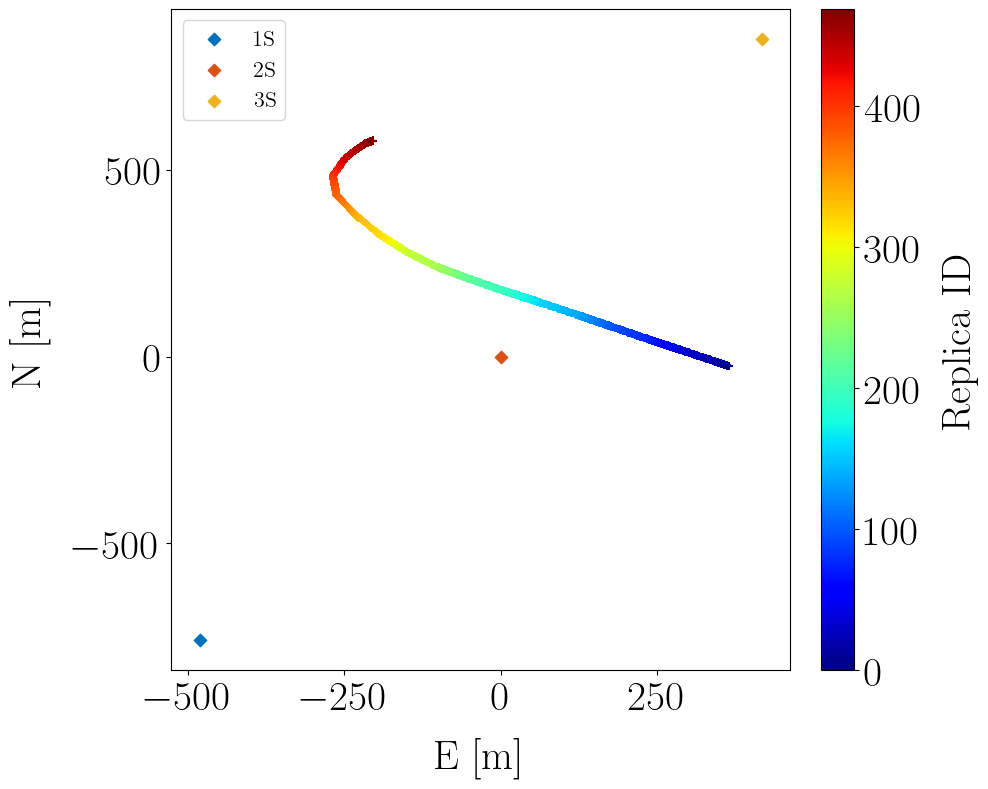

In [8]:
root_fig = os.path.join(sensibility_img_folder, "passive", f"library_{id_library}")
if not os.path.exists(root_fig):
    os.makedirs(root_fig)

plot_passive_positions(ds_replica=ds, ds_gps=ds_gps, root_fig=root_fig)

In [9]:
# Select frequency range
fmin = 400
fmax = 800
# Slice frequency
ds = ds.sel(f_rtf=slice(fmin, fmax))

freq = ds.f_rtf.values

# Build complex RTFs
rtf_cs_evd = ds.rtf_amp * np.exp(1j * ds.rtf_phase)


In [10]:
fig_folder = root_fig

In [11]:
fpath = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\sequences\passive\sequence_passive_2025-10-15_10-14-00_to_2025-10-15_10-18-00_rtf.nc"
ds_sig = xr.open_dataset(fpath)
ds_sig

<xarray.Dataset> Size: 193MB
Dimensions:        (h_index: 3, time: 480000, f_rtf: 4097, segment_dt: 470,
                    f_csdm: 4097, h_index_bis: 3)
Coordinates:
  * h_index        (h_index) int64 24B 1 2 3
  * time           (time) float32 2MB 0.0 0.0005 0.001 ... 240.0 240.0 240.0
  * f_rtf          (f_rtf) float32 16kB 0.0 0.2441 0.4883 ... 999.5 999.8 1e+03
  * segment_dt     (segment_dt) datetime64[ns] 4kB 2025-10-15T10:14:02 ... 20...
  * f_csdm         (f_csdm) float32 16kB 0.0 0.2441 0.4883 ... 999.5 999.8 1e+03
  * h_index_bis    (h_index_bis) int64 24B 1 2 3
Data variables:
    signal         (h_index, time) float32 6MB ...
    start_dt       datetime64[ns] 8B ...
    end_dt         datetime64[ns] 8B ...
    rtf_amp_hat    (h_index, f_rtf, segment_dt) float32 23MB ...
    rtf_phase_hat  (h_index, f_rtf, segment_dt) float32 23MB ...
    Rx             (f_csdm, h_index, h_index_bis, segment_dt) float32 69MB ...
    Rv             (f_csdm, h_index, h_index_bis, segment_dt) float32 69MB ...
Attributes:
    fs:                              2000
    ts:                              0.0005
    datetime_format:                 %Y-%m-%d_%H-%M-%S
    record_id:                       passive_2025-10-15_10-14-00_to_2025-10-1...
    root_img:                        C:\Users\baptiste.menetrier\Desktop\devP...
    root_data:                       C:\Users\baptiste.menetrier\Desktop\devP...
    h_index_ref:                     2
    analysis_segment_duration:       5
    analysis_segment_alpha_overlap:  0.9

## Visualisation des signaux 

In [12]:
# Load wav data and plot the corresponding sequence
ds_wav = xr.open_dataset(os.path.join(data_folder, "channel_H_wav.nc"))


In [13]:
start_dt = passive_replicas_args["start_datetimes"][0]
ds_sig.attrs["start_datetime"] = start_dt.strftime(ds_sig.datetime_format)
ds_sig.attrs

{'fs': np.int64(2000),
 'ts': np.float64(0.0005),
 'datetime_format': '%Y-%m-%d_%H-%M-%S',
 'record_id': 'passive_2025-10-15_10-14-00_to_2025-10-15_10-18-00',
 'root_img': 'C:\\Users\\baptiste.menetrier\\Desktop\\devPy\\phd\\real_data_analysis\\fiberscope_groix\\img\\sequences\\passive_2025-10-15_10-14-00_to_2025-10-15_10-18-00',
 'root_data': 'C:\\Users\\baptiste.menetrier\\Desktop\\devPy\\phd\\real_data_analysis\\fiberscope_groix\\data\\sequences\\passive',
 'h_index_ref': np.int64(2),
 'analysis_segment_duration': np.int64(5),
 'analysis_segment_alpha_overlap': np.float64(0.9),
 'start_datetime': '2025-10-15_10-14-00'}

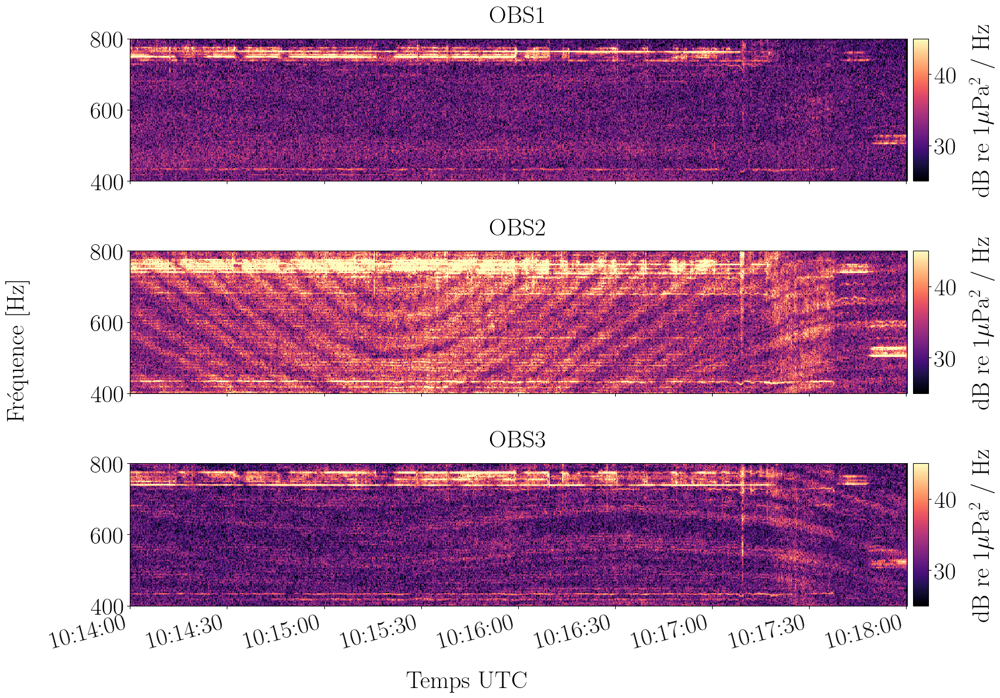

In [14]:
plot_sequence_spectrogram(ds_sig, ds_wav, fig_folder, nperseg=2**10, noverlap=2**9, fmin=fmin, fmax=fmax)

# Étape 2 : étude de la grandeur signante 

## Variations du module de $\Pi$ dans le plan (f, pos)


On s'intéresse aux variations de $\lvert \Pi \rvert$ dans le plan (f, numéro de réplique).

In [15]:
dist_rcv = get_dist_to_rcv(ds)
obs_cpa_idx = np.argmin(dist_rcv, axis=1).flatten()
reps = ds.replica_id.values

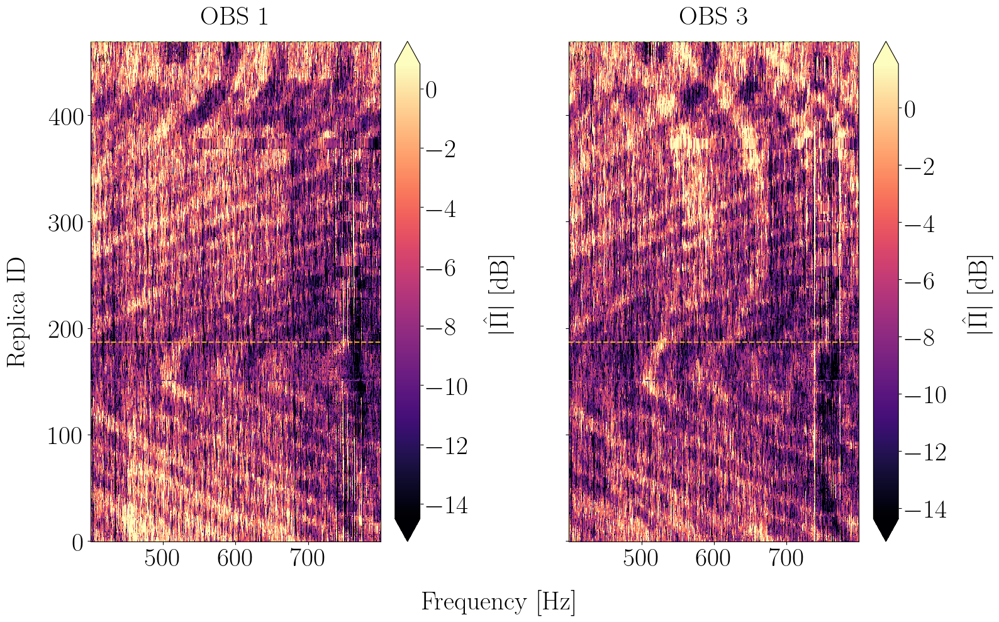

In [16]:
plot_rtf_mod_along_sequence(
    ds,
    dist_rcv,
    obs_cpa_idx,
    reps,
    fig_folder,
    replica_id_slice=slice(0, 500),
    fmin=fmin,
    fmax=fmax,
)

# Filtrage dans le plan (f, k)


L'objectif est d'extraire l'information associée aux interférences modales de grandes longueurs d'ondes (i.e à des petits $\Delta_{k{mn}}$) afin d'obtenir un lobe principal plus large permettant la mise en œuvre, en pratique de la méthode.

Pour se faire on applique une transformée de Fourier le long de l'axe r et on applique un filtre passe bas dans le domaine des nombres d'ondes. La distance $\theta$ est ensuite calculée sur les signaux filtrés. 

## Filtrage glissant 

Dans la suite : 

* La séquence entière est découpée en $Q$ fenêtres notées $\left ( I_q \right )_{q \in [0, Q-1]}$.
* Chaque fenêtre $I_q$ contient les estimations de $2P + 1$ vecteurs de RTF (correspondant ici à $2P + 1$ positions $r_p$ successives).
* Le recouvrement entre les fenêtres $I_q$ est de $2P$ positions $r_p$ de sorte que la fenêtre glisse d'une unique position lorsque q augmente de 1.  

In [116]:
# Range step
# dr = ds.r.values[1] - ds.r.values[0]
n_r = ds.replica_id.size

# Define the size of the Iq windows
P = 12
n_overlap_I = 1
n_I = 2 * P + 1
# size_I_r = n_I * dr

print(
    f"Selected window I size:  n_I = {n_I} samples"
)

# Compute the number of I_q windows Q
Q = int(np.floor((n_r + n_overlap_I - n_I)/n_overlap_I))
print(f"Number of available segments I : Q = {Q}")

Selected window I size:  n_I = 25 samples
Number of available segments I : Q = 446


### Choix du seuil de coupure $k_c$ 

#### Seuil défini en fonction du percentile d'énergie dans chaque bande 

Dans le cas où la période d'échantillonnage spatial est inconnue on doit définir le seuil $k_c$ automatiquement.  

Pour chaque bin fréquentiel, on définit le seuil en fonction d'un percentile $q$ donnée de la distribution d'énergie. 

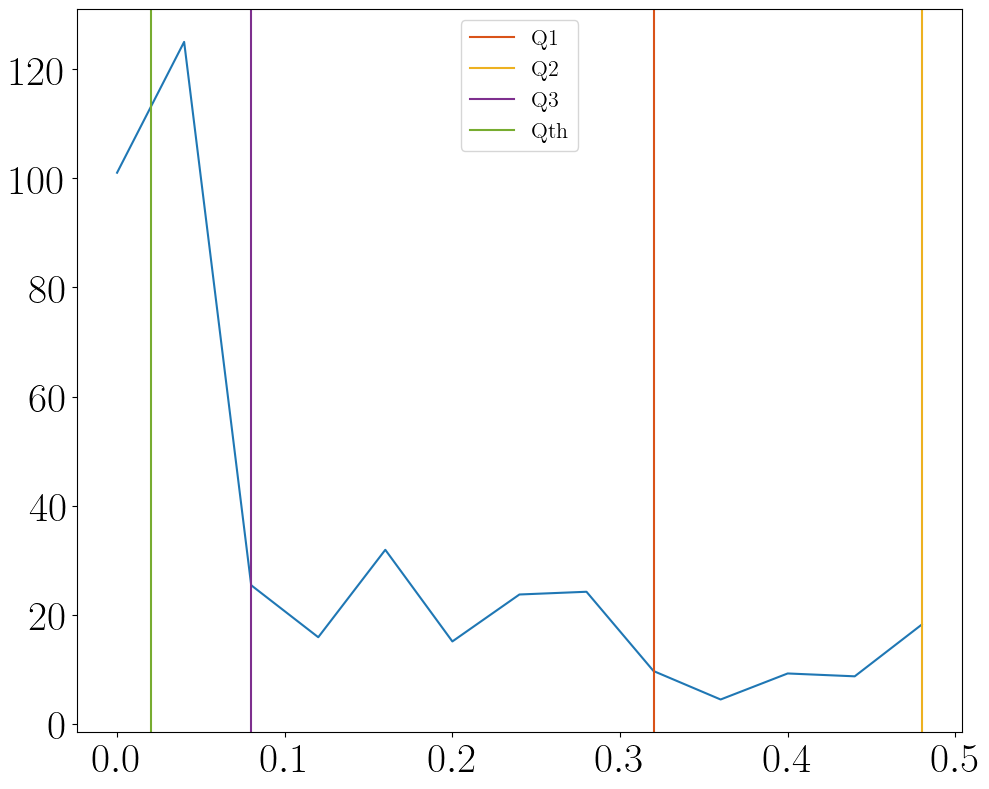

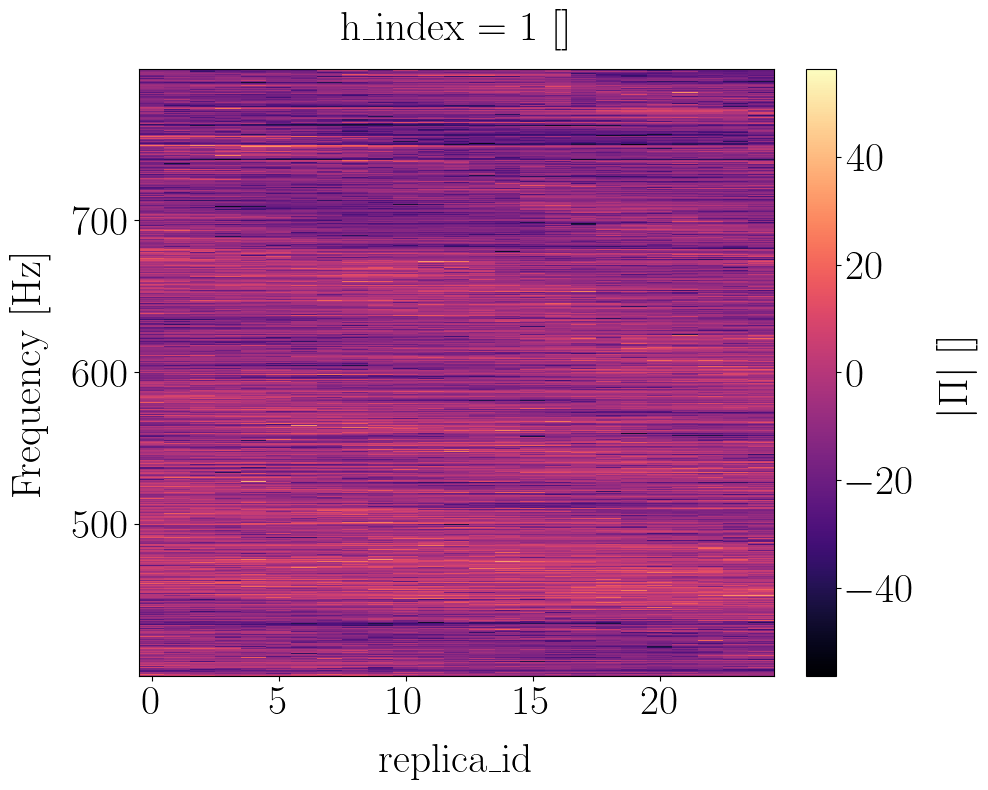

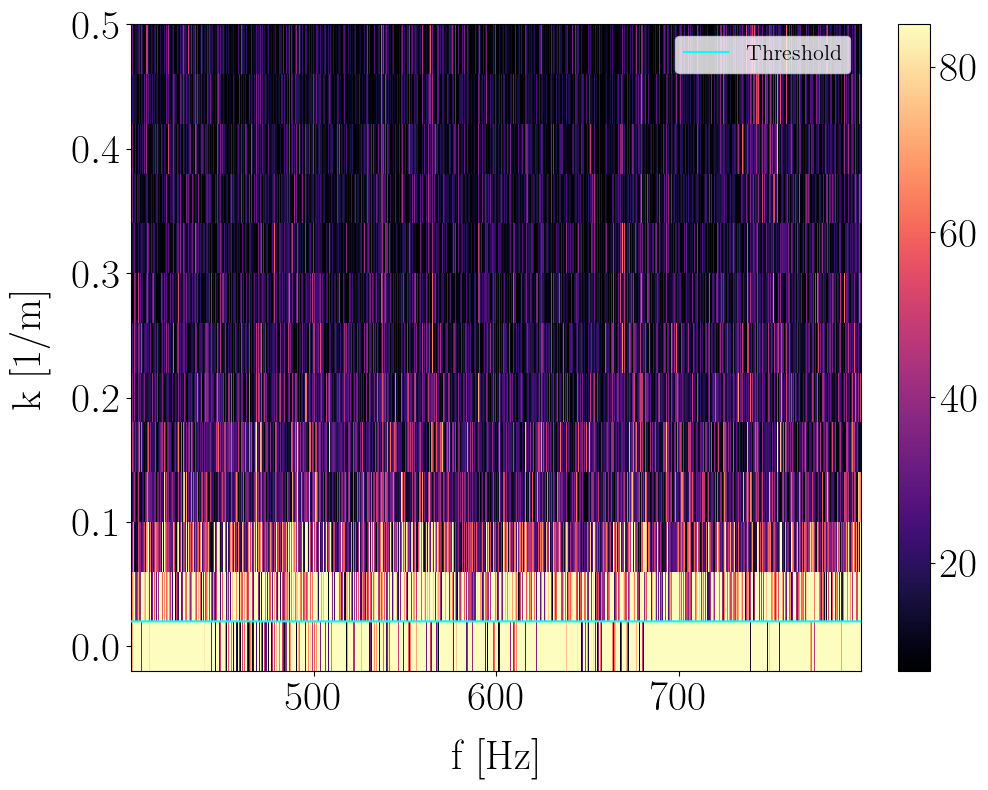

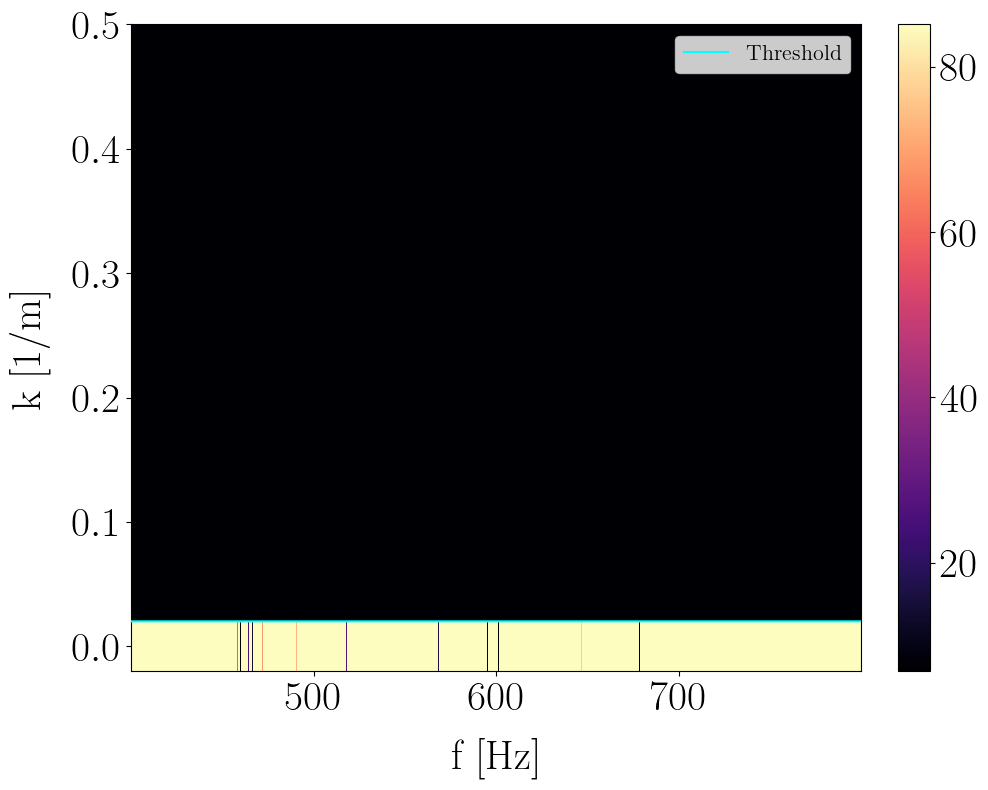

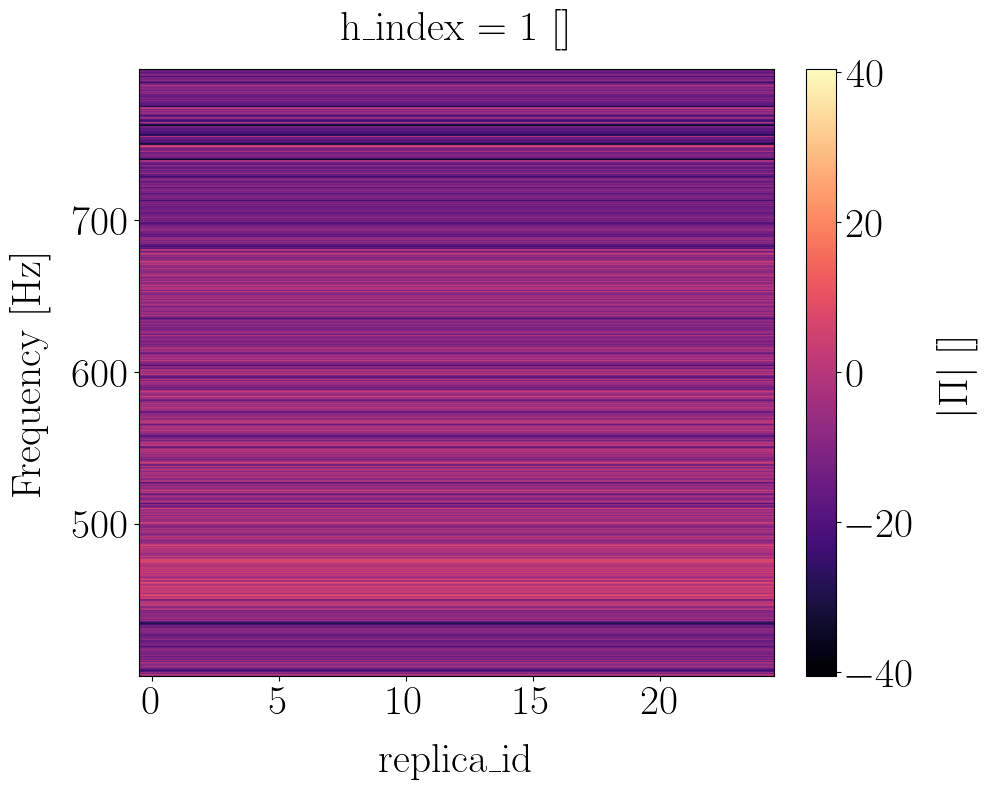

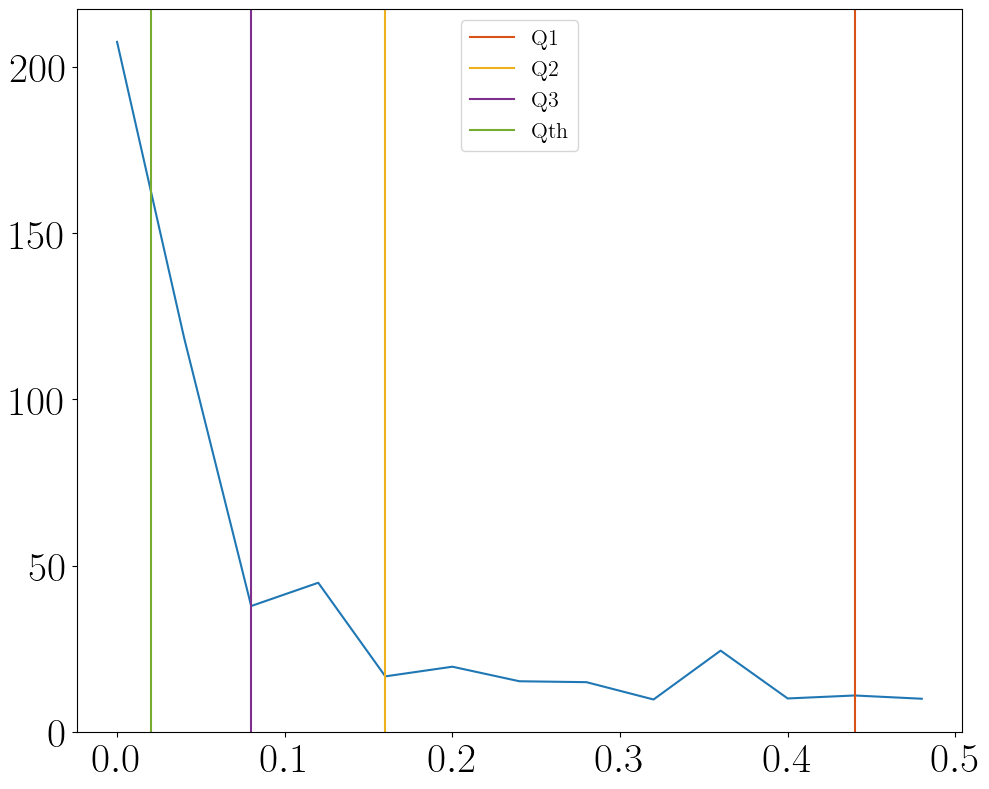

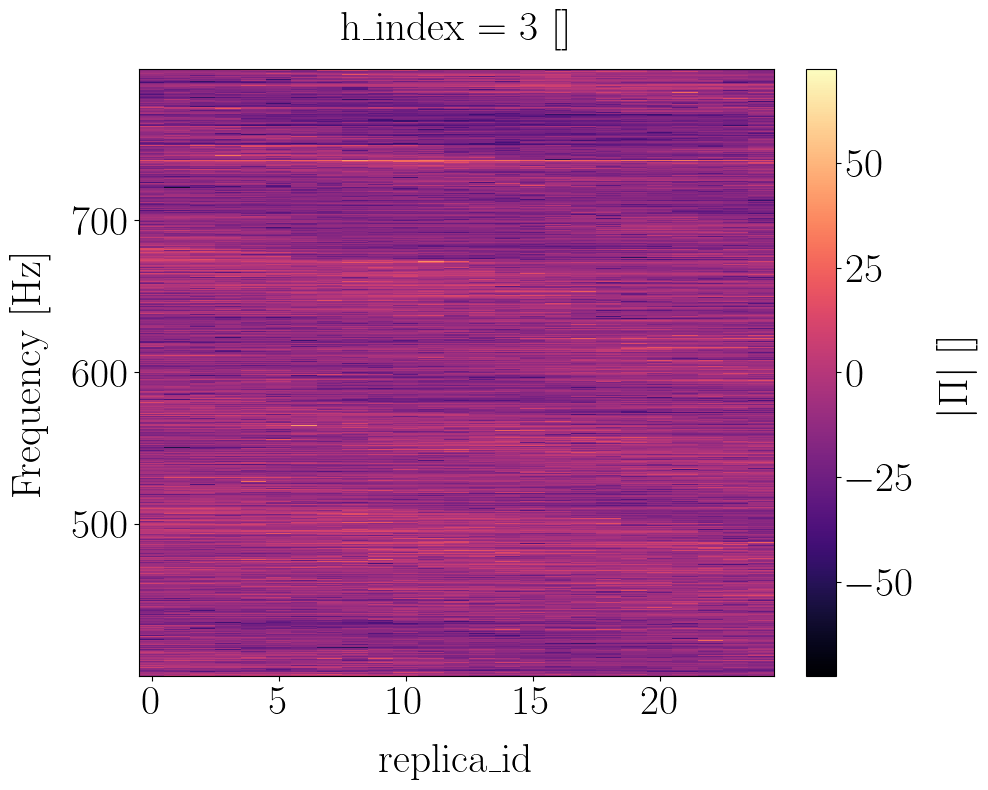

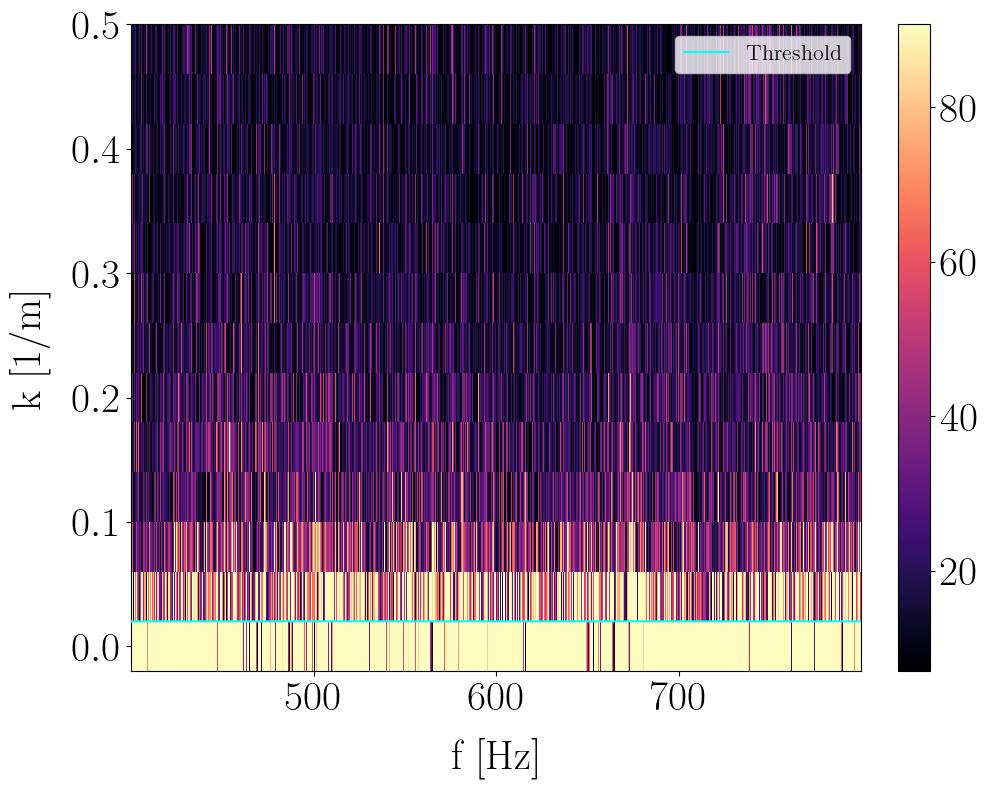

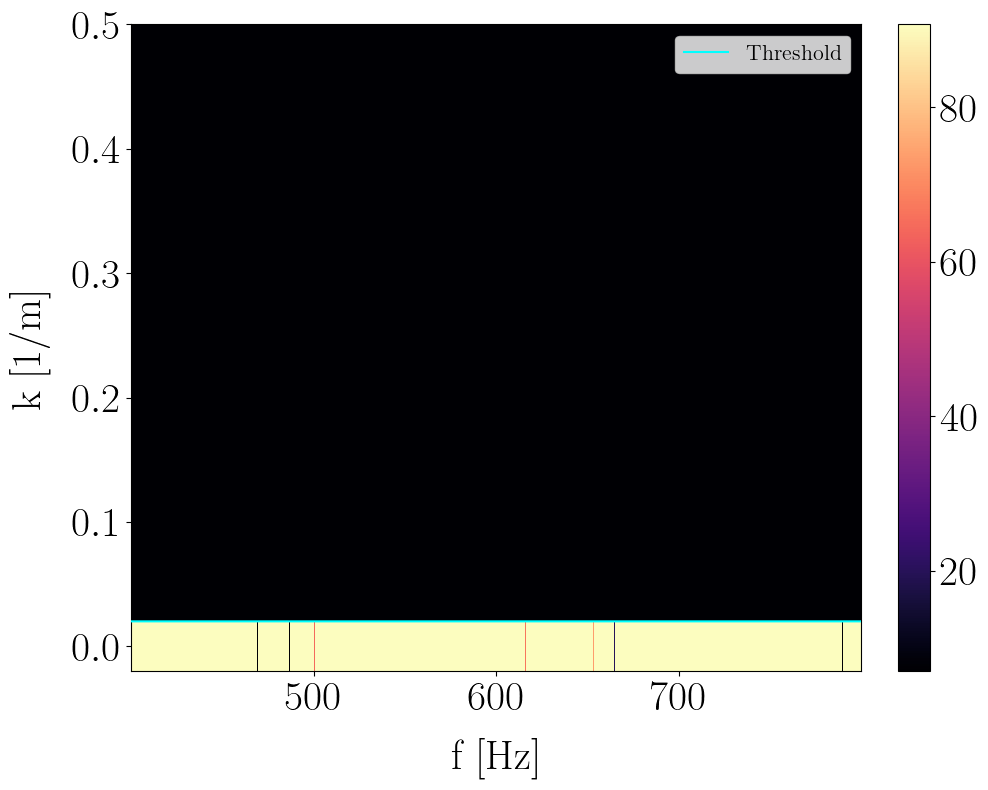

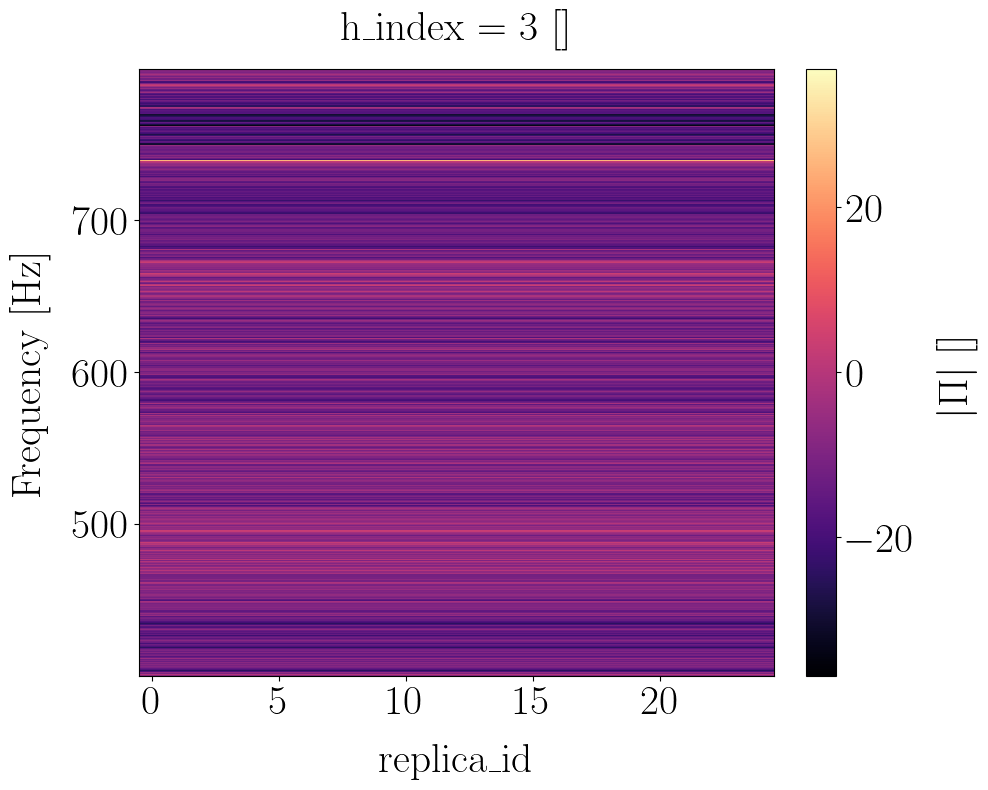

In [117]:
f = ds.f_rtf.values 
qth = 99.5

idx_rcvs = [
    idx
    for idx in rtf_cs_evd.h_index.values
    if idx != ds.reference_receiver_id
]

smooth_data = np.ones_like(ds.rtf_amp)
for idx_rcv in idx_rcvs:

    rtf_mod = ds.rtf_amp.sel(h_index=idx_rcv)
    rtf_mod_smooth = rtf_mod.copy().values

    for q in range(0, Q):
        I_q_inf = q * n_overlap_I
        I_q_sup = q * n_overlap_I + n_I
        I_q_center = q * n_overlap_I + P  # P = n_I // 2
        # print(I_q_inf, I_q_sup)
        # Select I_q
        rtf_I_q = rtf_mod.isel(replica_id=slice(I_q_inf, I_q_sup))
        # Apply filter
        rtf_I_q = 10 * np.log10(rtf_I_q**2)
        # Apply FFT along the r dimension
        rtf_I_q_fft = np.fft.rfft(rtf_I_q, axis=1)
        rtf_I_q_psd = np.abs(rtf_I_q_fft)

        k = np.fft.rfftfreq(rtf_I_q.shape[1], d=1)  #

        # Extract quantiles of the distribution and their corresponding x values
        q_th = np.percentile(rtf_I_q_psd, qth, axis=1)

        # # Get abcisse corresponding to the quantiles : x_q1, mu(x_q1) = q1, x_q2, mu(x_q2) = q2, x_q3, mu(x_q3) = q3
        dx_qth = np.abs(rtf_I_q_psd - q_th[:, np.newaxis])  #
        idx_xqth = np.argmin(dx_qth, axis=1)
        x_qth = k[idx_xqth]
        # print(x_qth)

        # Smooth with rolling average to avoid abrupt changes betweens adjacent bins
        n_roll_avg = 5
        x_qth = np.convolve(x_qth, np.ones(n_roll_avg) / n_roll_avg, mode="same")

        # TODO change this
        x_qth[:] = 0.02

        # Filter desired k
        rtf_I_q_fft_filt = np.copy(rtf_I_q_fft)     # nf, nk
        # Define dedicated mask
        kk, ff = np.meshgrid(k, f)
        mask_fk = kk > x_qth[:, np.newaxis]
        # Apply mask
        rtf_I_q_fft_filt[mask_fk] = 0
        rtf_I_q_filt = np.fft.irfft(rtf_I_q_fft_filt, n=rtf_I_q.shape[1], axis=1)
        rtf_I_q_filt = 10 ** (rtf_I_q_filt / 20)

        if q == 0:
            q1 = np.percentile(rtf_I_q_psd, 25, axis=1)
            q2 = np.percentile(rtf_I_q_psd, 50, axis=1)
            q3 = np.percentile(rtf_I_q_psd, 75, axis=1)

            # Q1
            dx_q1 = np.abs(rtf_I_q_psd - q1[:, np.newaxis])  #
            idx_xq1 = np.argmin(dx_q1, axis=1)
            x_q1 = k[idx_xq1]
            # Q2
            dx_q2 = np.abs(rtf_I_q_psd - q2[:, np.newaxis])
            idx_xq2 = np.argmin(dx_q2, axis=1)
            x_q2 = k[idx_xq2]
            # Q3
            dx_q3 = np.abs(rtf_I_q_psd - q3[:, np.newaxis])
            idx_xq3 = np.argmin(dx_q3, axis=1)
            x_q3 = k[idx_xq3]

            plt.figure()
            plt.plot(k, rtf_I_q_psd[0, :])
            plt.axvline(x_q1[0], color=color(1), label="Q1")
            plt.axvline(x_q2[0], color=color(2), label="Q2")
            plt.axvline(x_q3[0], color=color(3), label="Q3")
            plt.axvline(x_qth[0], color=color(4), label="Qth")
            plt.legend()

            plt.figure()
            rtf_I_q.plot(x="replica_id", cmap="magma")

            plt.figure()
            vmin = np.percentile(rtf_I_q_psd, 10)
            vmax = np.percentile(rtf_I_q_psd, 90)
            plt.pcolormesh(f, k, rtf_I_q_psd.T, cmap="magma", vmax=vmax, vmin=vmin)
            plt.plot(f, x_qth, color="cyan", label="Threshold", zorder=10)
            plt.colorbar()
            plt.xlabel("f [Hz]")
            plt.ylabel("k [1/m]")
            plt.legend()

            plt.figure()
            rtf_I_q_fft_filt_psd = np.abs(rtf_I_q_fft_filt)**2
            vmin = np.percentile(rtf_I_q_psd, 10)
            vmax = np.percentile(rtf_I_q_psd, 90)
            plt.pcolormesh(
                f, k, np.abs(rtf_I_q_fft_filt_psd).T, cmap="magma", vmax=vmax, vmin=vmin
            )
            plt.plot(f, x_qth, color="cyan", label="Threshold", zorder=10)
            plt.colorbar()
            plt.xlabel("f [Hz]")
            plt.ylabel("k [1/m]")
            plt.legend()

            plt.figure()
            rtf_I_q_filt_xr = xr.zeros_like(rtf_I_q)
            rtf_I_q_filt_xr.data = rtf_I_q_filt
            rtf_I_q_filt_plot = 10 * np.log10(rtf_I_q_filt_xr**2)
            rtf_I_q_filt_plot.plot(x="replica_id", cmap="magma")

            # print(I_q_center)

        # Store modified rtf
        rtf_mod_smooth[:, I_q_center] = rtf_I_q_filt[:, P]
        # rtf_I_q_filt_P = rtf_I_q_filt[:, P]     # Center of the box
        # smooth_rtfs.append(rtf_I_q_filt_P)

    i_rcv = np.argmin(np.abs(rtf_cs_evd.h_index.values - idx_rcv))
    smooth_data[i_rcv, ...] = rtf_mod_smooth

In [118]:
ds_smooth = ds.copy()
ds_smooth.rtf_amp.data = smooth_data

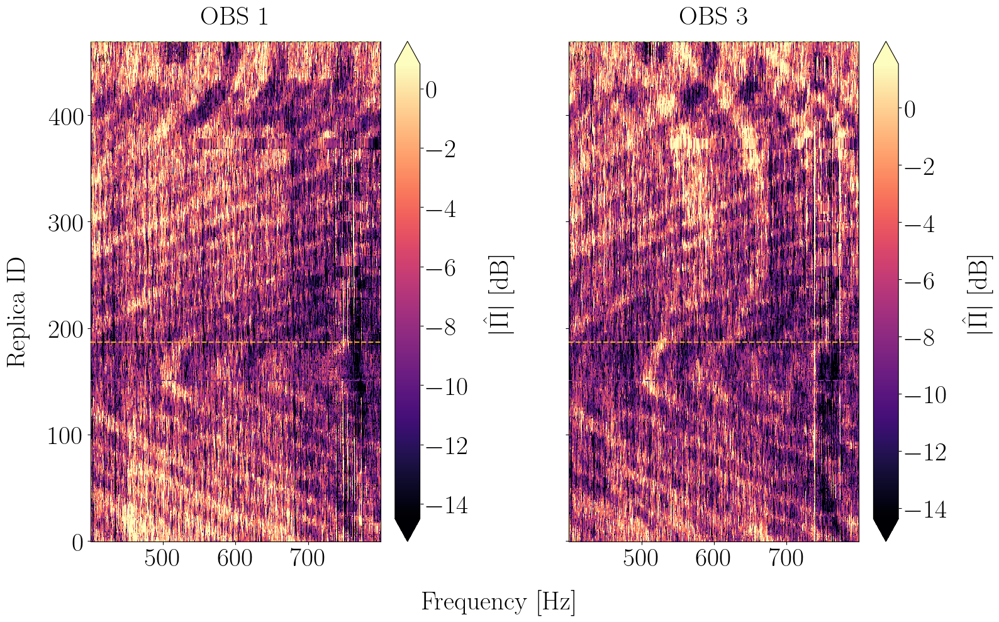

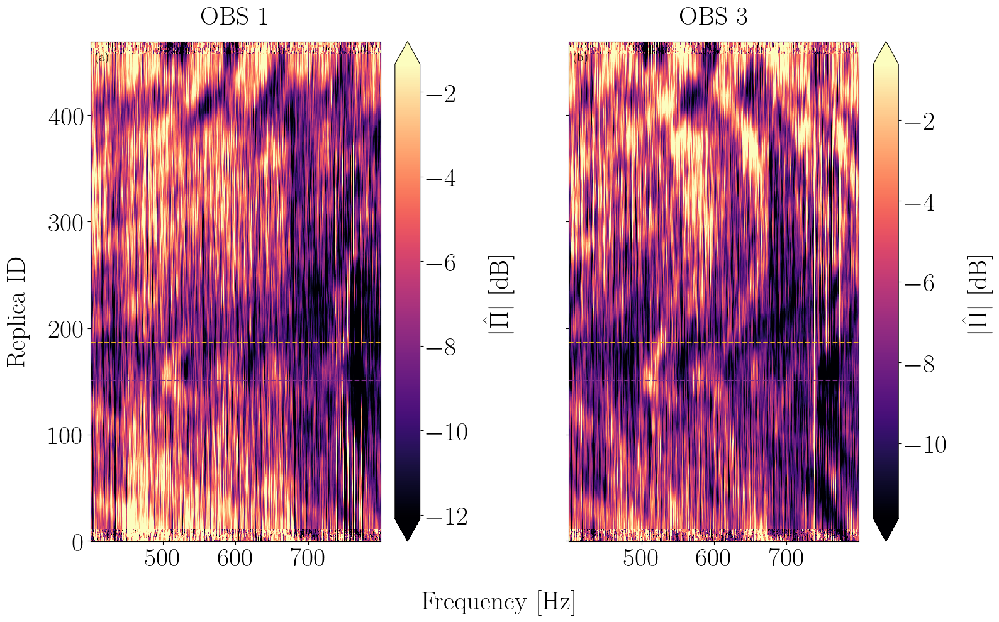

In [119]:
plot_rtf_mod_along_sequence(
    ds,
    dist_rcv,
    obs_cpa_idx,
    reps,
    fig_folder,
    replica_id_slice=slice(0, 500),
    fmin=fmin,
    fmax=fmax,
)

plot_rtf_mod_along_sequence(
    ds_smooth,
    dist_rcv,
    obs_cpa_idx,
    reps,
    fig_folder,
    replica_id_slice=slice(0, 500),
    fmin=fmin,
    fmax=fmax,
)

In [120]:
# plt.figure()
# a = 10 * np.log10(ds.rtf_amp.sel(h_index=idx_rcv))
# a.plot(x="replica_id", cmap="magma")

# plt.figure()
# a = 10 * np.log10(ds_smooth.rtf_amp.sel(h_index=idx_rcv))
# a.plot(x="replica_id", cmap="magma")

# distances = ["hermitian_angle"]
# dist1 = get_dist(ds, distances=distances)
# dist2 = get_dist(ds_smooth, distances=distances)

# plt.figure()
# plt.plot(ds.r.values, dist1["hermitian_angle"]["d"], label="original")
# plt.plot(ds.r.values, dist2["hermitian_angle"]["d"], label="smooth")
# plt.legend()

# # # Remove first and last points out of windows
# # I_q_center_first = 0 * n_overlap_I + P  # P = n_I // 2
# # I_q_center_last = (Q-1) * n_overlap_I + P  # P = n_I // 2
# # # print(I_q_center_first, I_q_center_last)

# # d1 = dist1["hermitian_angle"]["d"][I_q_center_first : I_q_center_last + 1]
# # d2 = dist2["hermitian_angle"]["d"][I_q_center_first : I_q_center_last + 1]
# # r_valid = ds.r.values[I_q_center_first : I_q_center_last + 1]
# # d1 = (d1 - d1.min()) / (d1.max() - d1.min())
# # d2 = (d2 - d2.min()) / (d2.max() - d2.min())
# # plt.figure()
# # plt.plot(r_valid, d1, label="original")
# # plt.plot(r_valid, d2, label="smooth")
# # plt.legend()


# # Zoom on main lobe
# r_offset = 200
# zoom_inf = np.argmin(np.abs(ds.r.values - (ds.r_ref - r_offset)))
# zoom_sup = np.argmin(np.abs(ds.r.values - (ds.r_ref + r_offset)))
# d1_zoom = dist1["hermitian_angle"]["d"][zoom_inf : zoom_sup + 1]
# d2_zoom = dist2["hermitian_angle"]["d"][zoom_inf : zoom_sup + 1]
# r_zoom = ds.r.values[zoom_inf : zoom_sup + 1]
# d1_zoom = (d1_zoom - d1_zoom.min()) / (d1_zoom.max() - d1_zoom.min())
# d2_zoom = (d2_zoom - d2_zoom.min()) / (d2_zoom.max() - d2_zoom.min())
# plt.figure()
# plt.plot(r_zoom, d1_zoom, label="original")
# plt.plot(r_zoom, d2_zoom, label="smooth")
# plt.legend()


# # plt.xlim([ds.r_ref - 150, ds.r_ref + 150])

# # # debug : Check first is ok
# # plt.figure()
# # a = 10 * np.log10(np.abs(ds_smooth.data.sel(h_index=2)))
# # a.plot(x="r", cmap="magma")
# # plt.xlim([ds.r.values[I_q_center_first - 10], ds.r.values[I_q_center_first + 10]])

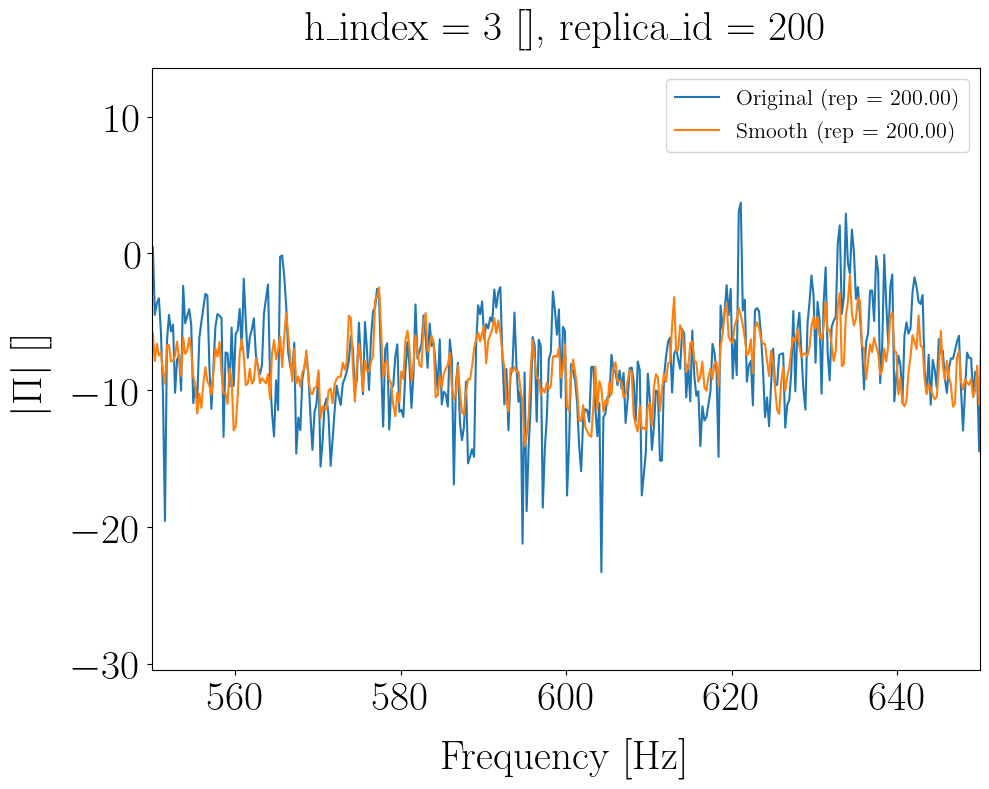

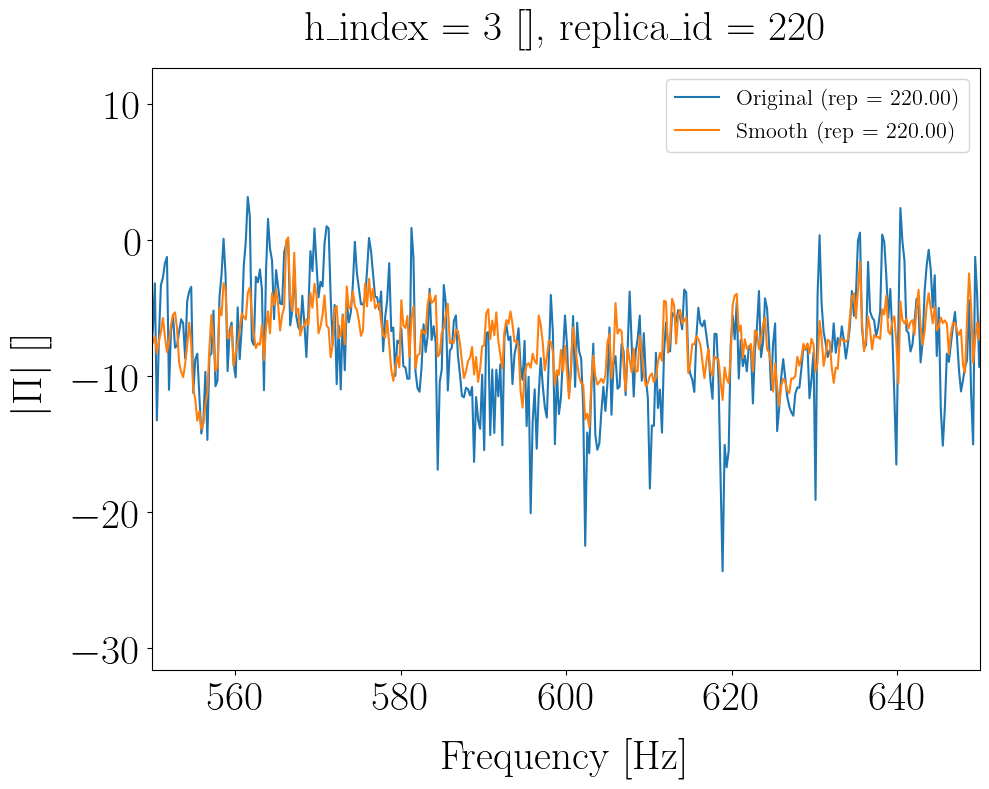

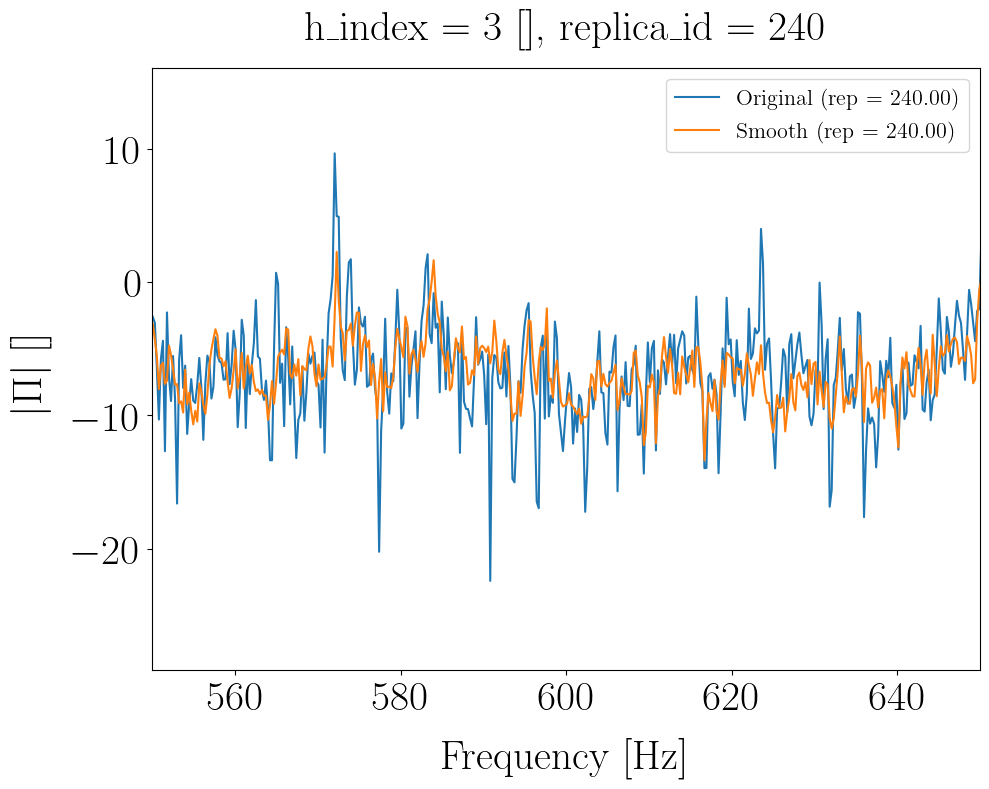

In [121]:
before_smooth = 10 * np.log10(ds.rtf_amp.sel(h_index=idx_rcv))
after_smooth = 10 * np.log10(ds_smooth.rtf_amp.sel(h_index=idx_rcv))

# sel_ranges = [ds.r_ref, ds.r_ref+10, ds.r_ref+20, ds.r_ref+30]
# for i_rs, rs in enumerate(sel_ranges):
#     before_smooth_rs = before_smooth.sel(r=rs, method="nearest")
#     after_smooth_rs = after_smooth.sel(r=rs, method="nearest")

sel_reps = [200, 220, 240]
for i_rep, rep in enumerate(sel_reps):
    before_smooth_rs = before_smooth.sel(replica_id=rep, method="nearest")
    after_smooth_rs = after_smooth.sel(replica_id=rep, method="nearest")

    plt.figure()
    before_smooth_rs.plot(x="f_rtf", label=f"Original (rep = {before_smooth_rs.replica_id.values:.2f})")
    after_smooth_rs.plot(x="f_rtf", label=f"Smooth (rep = {after_smooth_rs.replica_id.values:.2f})")
    # plt.xscale("log")
    plt.legend()

    plt.xlim([550, 650])

In [122]:
def get_bootstrap_dist(ds, test_replica_id):
    # Select one replica_id to compare using bootstrap
    test_replica = ds.sel(replica_id=test_replica_id)
    # Remove from the rest of the features for bootstraping
    # bootstrap_replica = ds.drop_sel(replica_id=test_replica_id)
    bootstrap_replica = ds


    # Test RTF
    test_replica_rtf = test_replica.rtf_amp * np.exp(1j * test_replica.rtf_phase)

    # Other RTFs
    bootstrap_replica_rtfs = bootstrap_replica.rtf_amp * np.exp(
        1j * bootstrap_replica.rtf_phase
    )

    # Reshape to 4D array to be able to apply distance function : (n_rcv, n_freq, n_segment_dt) -> (n_rcv, n_freq, n_segment_dt, 1)
    bootstrap_replica_rtfs = bootstrap_replica_rtfs.values[..., np.newaxis]

    # # Compute dist
    dist_kwargs = {"ax_rcv": 0, "ax_f": 1, "apply_mean": True}
    # dist = D_hermitian_angle_fast(
    #     rtf_ref=test_replica_rtf.values,
    #     rtf=bootstrap_replica_rtfs,
    #     **dist_kwargs,
    # )

    rtf_ref = np.abs(test_replica_rtf.values)
    rtf = np.abs(bootstrap_replica_rtfs)
    dist = D_hermitian_angle_fast(
        rtf_ref=rtf_ref,
        rtf=rtf,
        **dist_kwargs,
    )

    # # EUCLIDEAN distance
    # d_rcv_1 = np.linalg.norm(
    #     np.abs(test_replica_rtf.sel(h_index=1).values)[:, np.newaxis]
    #     - np.abs(bootstrap_replica_rtfs[0, ...]), axis=0
    # )
    # d_rcv_2 = np.linalg.norm(
    #     np.abs(test_replica_rtf.sel(h_index=2).values)[:, np.newaxis]
    #     - np.abs(bootstrap_replica_rtfs[1, ...]),
    #     axis=0,
    # )
    # d_rcv_3 = np.linalg.norm(
    #     np.abs(test_replica_rtf.sel(h_index=3).values)[:, np.newaxis]
    #     - np.abs(bootstrap_replica_rtfs[2, ...]),
    #     axis=0,
    # )
    # dist = 1 / 3 * (d_rcv_1 + d_rcv_2 + d_rcv_3)

    # # # Compute dist
    # dist_kwargs = {"ax_rcv": 0, "ax_f": 1, "apply_mean": True}
    # dist = D_euclidian(
    #     rtf_ref=np.abs(test_replica_rtf.isel(h_index=slice(0, 1)).values),
    #     rtf=np.abs(bootstrap_replica_rtfs[0:1, ...]),
    #     **dist_kwargs,
    # )

    # # Expand rtf_ref along the necessary axes for broadcasting
    # rtf_ref_expanded = cast_matrix_to_target_shape(rtf_ref, rtf.shape)

    # # Calculate euclidian distance
    # # d_euc = np.sqrt(np.sum(np.abs(rtf_ref_expanded - rtf) ** 2, axis=1))
    # dist = np.linalg.norm(rtf_ref_expanded - rtf, axis=1)

    return dist 

In [123]:
def get_bootstrap_dist_matrix(ds):
    dist_mat = []
    for i, id in enumerate(ds.replica_id.values): 
        dist_id = get_bootstrap_dist(ds=ds, test_replica_id=id)
        # dist_id = np.concatenate([dist_id[0:i], np.array([0]), dist_id[i:]])       # Add 0 on diagonal 
        dist_mat.append(dist_id)

    dist_mat = np.array(dist_mat)
    return dist_mat

In [124]:
def get_dist_to_rcv(ds):
    e = ds["e_replica"].values
    n = ds["n_replica"].values

    rep_pos = np.column_stack((e, n))
    dist_to_rcv = []
    for i_rcv in ds.h_index.values:
        e_rcv = ds.attrs[f"obs{i_rcv}_e_apriori"]
        n_rcv = ds.attrs[f"obs{i_rcv}_n_apriori"]
        rcv_pos = np.column_stack((e_rcv, n_rcv))

        spatial_dist = cdist(rep_pos, rcv_pos, metric="euclidean")
        dist_to_rcv.append(spatial_dist)

    return np.array(dist_to_rcv)


In [125]:
theta_mat = get_bootstrap_dist_matrix(ds=ds)

In [126]:
dist_rcv = get_dist_to_rcv(ds=ds)

Text(0.5, 0, 'Replica index')

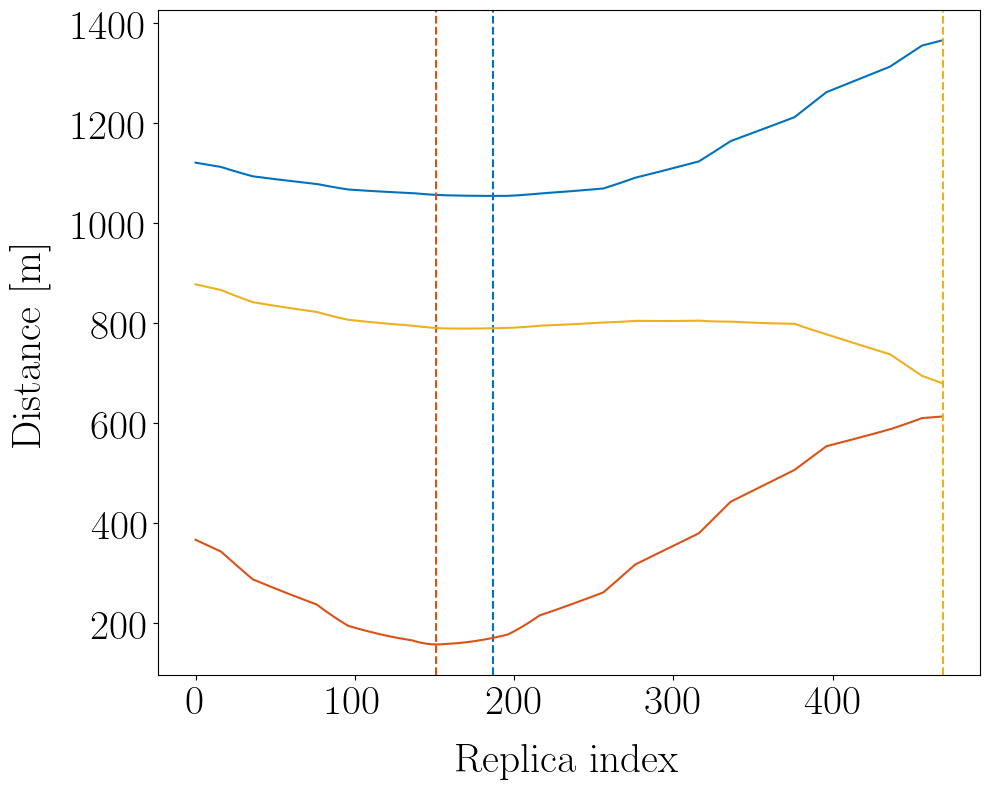

In [127]:
plt.figure()
cpa_idx = []
for i, i_rcv in enumerate(ds.h_index.values):
    plt.plot(dist_rcv[i, :], label=f"OBS{i_rcv}", color=color(i))

    cpa_rcv_idx = np.argmin(dist_rcv[i, :])
    plt.axvline(cpa_rcv_idx, linestyle="--", color=color(i))
    cpa_idx.append(cpa_rcv_idx)
    
plt.ylabel(f"Distance [m]")
plt.xlabel("Replica index")

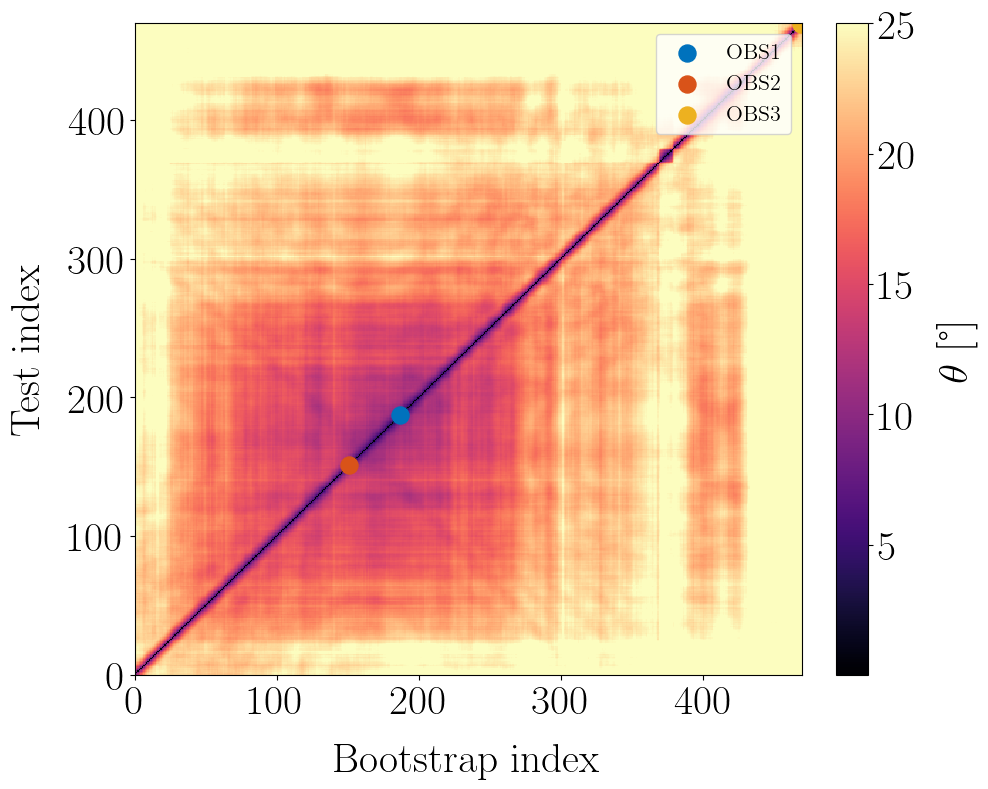

In [128]:
vmax = np.nanpercentile(theta_mat, 75)

plt.figure()
im = plt.pcolormesh(theta_mat, cmap="magma", vmax=vmax)
plt.colorbar(im, label=r"$\theta$ [°]")

# Add CPA indication
for i, i_rcv in enumerate(ds.h_index.values):
    plt.scatter(
        cpa_idx[i], cpa_idx[i], marker="o", s=150, color=color(i), label=f"OBS{i_rcv}"
    )
plt.xlabel("Bootstrap index")
plt.ylabel("Test index")
plt.legend()

fpath = os.path.join(
    root_img,
    f"bootstrap_event_win{rtf_mfp_processor.fsm_passive_analysis_segment_duration}s_overlap{rtf_mfp_processor.fsm_passive_analysis_segment_alpha_overlap}.png",
)
plt.savefig(fpath)

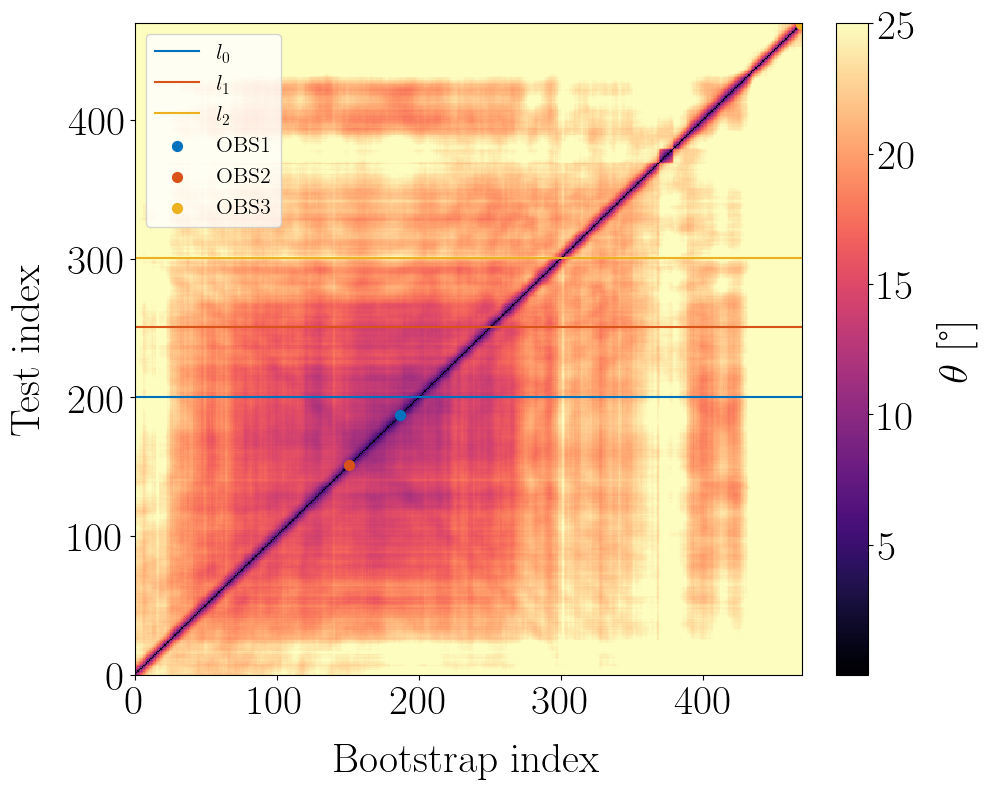

In [129]:
# Quelques lignes à la loupe
i_ls = [200, 250, 300]
# i_ls = [600, 640, 650, 660, 670, 700]

# i_ls = rep_selection

plt.figure()
im = plt.pcolormesh(
    theta_mat, cmap="magma", vmax=vmax
)
for k, i_l in enumerate(i_ls):
    plt.axhline(i_l+0.5, color=color(k), label=rf"$l_{k}$")

plt.colorbar(im, label=r"$\theta$ [°]")
# Add CPA indication
for i, i_rcv in enumerate(ds.h_index.values):
    plt.scatter(
        cpa_idx[i], cpa_idx[i], marker="o", s=50, color=color(i), label=f"OBS{i_rcv}"
    )
plt.xlabel("Bootstrap index")
plt.ylabel("Test index")
plt.legend(fontsize=16, loc="upper left")

# fpath = os.path.join(
#     root_img,
#     f"bootstrap_lib_win{rtf_mfp_processor.fsm_passive_analysis_segment_duration}s_overlap{rtf_mfp_processor.fsm_passive_analysis_segment_alpha_overlap}_zoomobs3_lines.png",
# )
# plt.savefig(fpath)

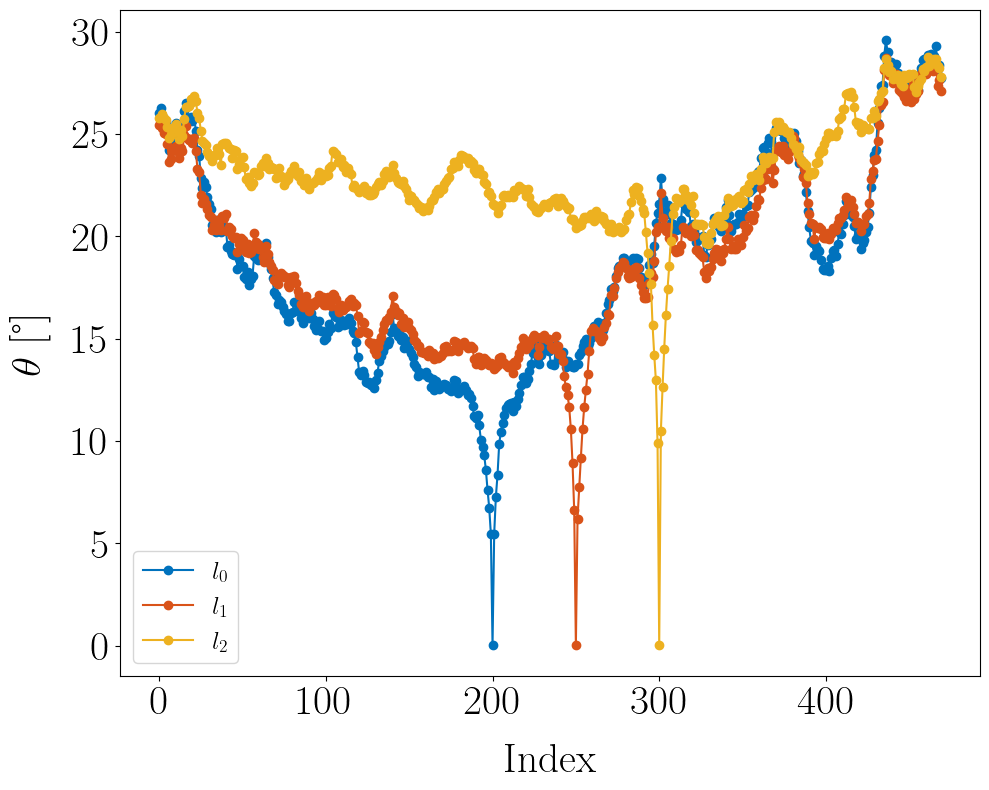

In [130]:
plt.figure()
for k, i_l in enumerate(i_ls):
    plt.plot(theta_mat[i_l, :], marker="o", color=color(k), label=rf"$l_{k}$")

plt.legend(fontsize=18)
plt.xlabel("Index")
plt.ylabel(r"$\theta$ [°]")
# plt.ylim([0, 20])
# plt.xlim([550, 750])

fpath = os.path.join(
    root_img,
    f"bootstrap_lib_win{rtf_mfp_processor.fsm_passive_analysis_segment_duration}s_overlap{rtf_mfp_processor.fsm_passive_analysis_segment_alpha_overlap}_zoomobs3_asymetry.png",
)
plt.savefig(fpath)

In [131]:
theta_mat_smooth = get_bootstrap_dist_matrix(ds=ds_smooth)

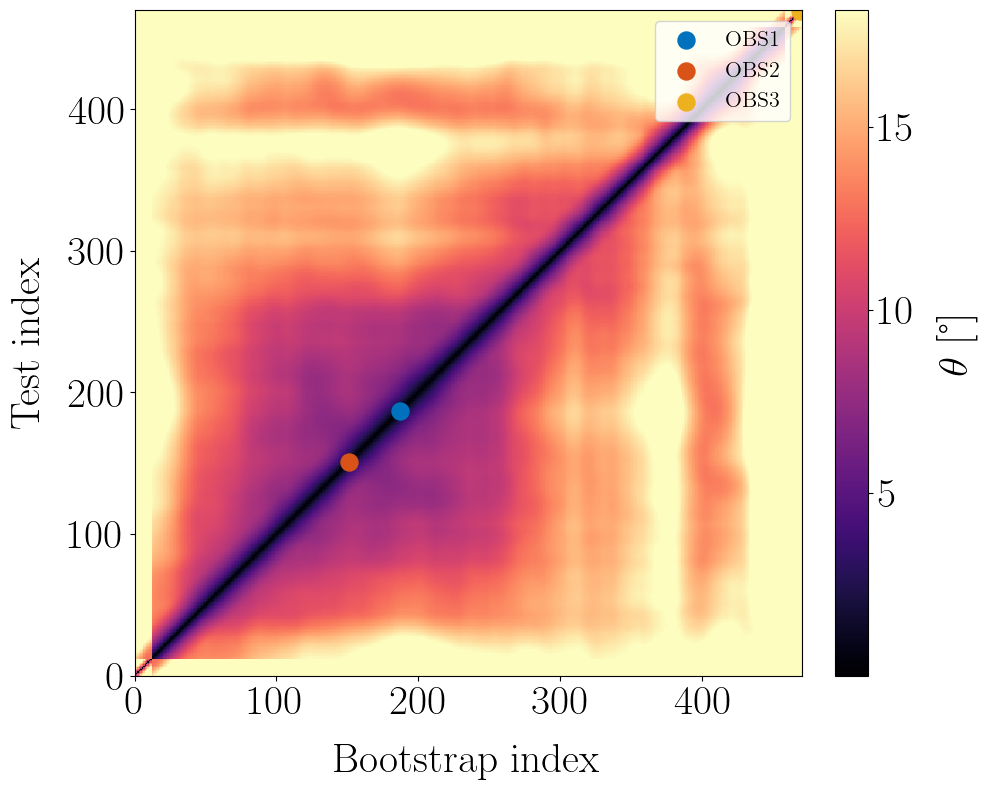

In [132]:
vmax = np.nanpercentile(theta_mat_smooth, 75)

plt.figure()
im = plt.pcolormesh(theta_mat_smooth, cmap="magma", vmax=vmax)
plt.colorbar(im, label=r"$\theta$ [°]")

# Add CPA indication
for i, i_rcv in enumerate(ds_smooth.h_index.values):
    plt.scatter(
        cpa_idx[i], cpa_idx[i], marker="o", s=150, color=color(i), label=f"OBS{i_rcv}"
    )
plt.xlabel("Bootstrap index")
plt.ylabel("Test index")
plt.legend()

# fpath = os.path.join(
#     root_img,
#     f"bootstrap_event_win{rtf_mfp_processor.fsm_passive_analysis_segment_duration}s_overlap{rtf_mfp_processor.fsm_passive_analysis_segment_alpha_overlap}.png",
# )
# plt.savefig(fpath)

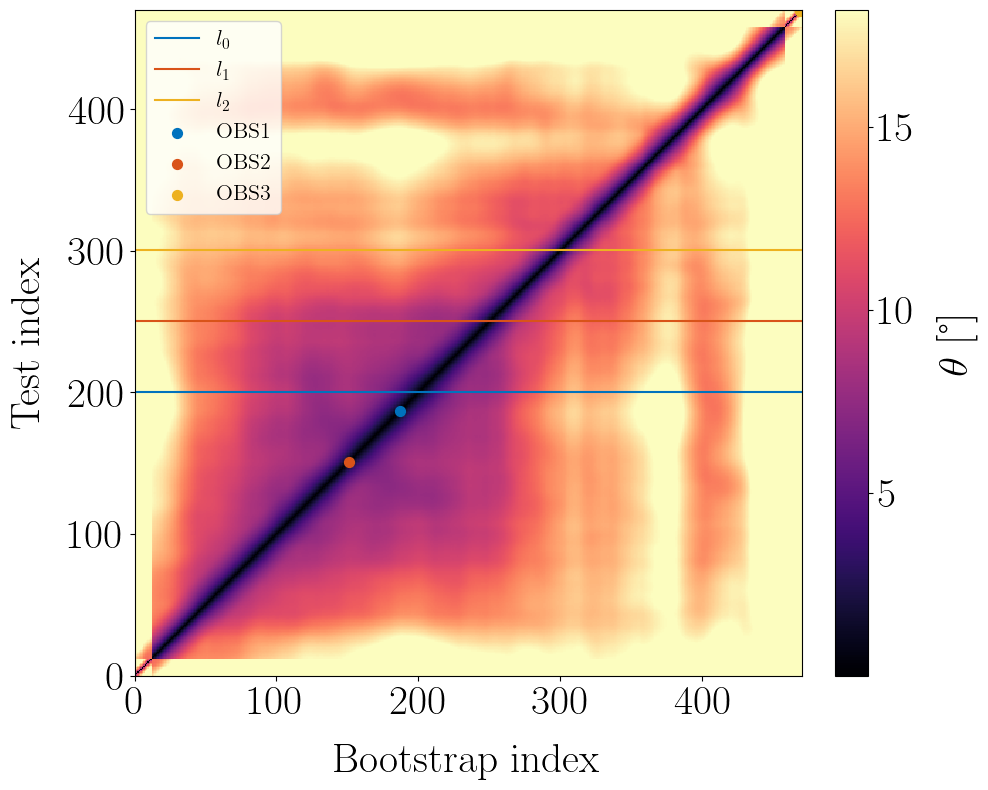

In [133]:
# Quelques lignes à la loupe
i_ls = [200, 250, 300]
# i_ls = [600, 640, 650, 660, 670, 700]

# i_ls = rep_selection

plt.figure()
im = plt.pcolormesh(theta_mat_smooth, cmap="magma", vmax=vmax)
for k, i_l in enumerate(i_ls):
    plt.axhline(i_l+0.5, color=color(k), label=rf"$l_{k}$")

plt.colorbar(im, label=r"$\theta$ [°]")
# Add CPA indication
for i, i_rcv in enumerate(ds_smooth.h_index.values):
    plt.scatter(
        cpa_idx[i], cpa_idx[i], marker="o", s=50, color=color(i), label=f"OBS{i_rcv}"
    )
plt.xlabel("Bootstrap index")
plt.ylabel("Test index")
plt.legend(fontsize=16, loc="upper left")

# fpath = os.path.join(
#     root_img,
#     f"bootstrap_lib_win{rtf_mfp_processor.fsm_passive_analysis_segment_duration}s_overlap{rtf_mfp_processor.fsm_passive_analysis_segment_alpha_overlap}_zoomobs3_lines.png",
# )
# plt.savefig(fpath)

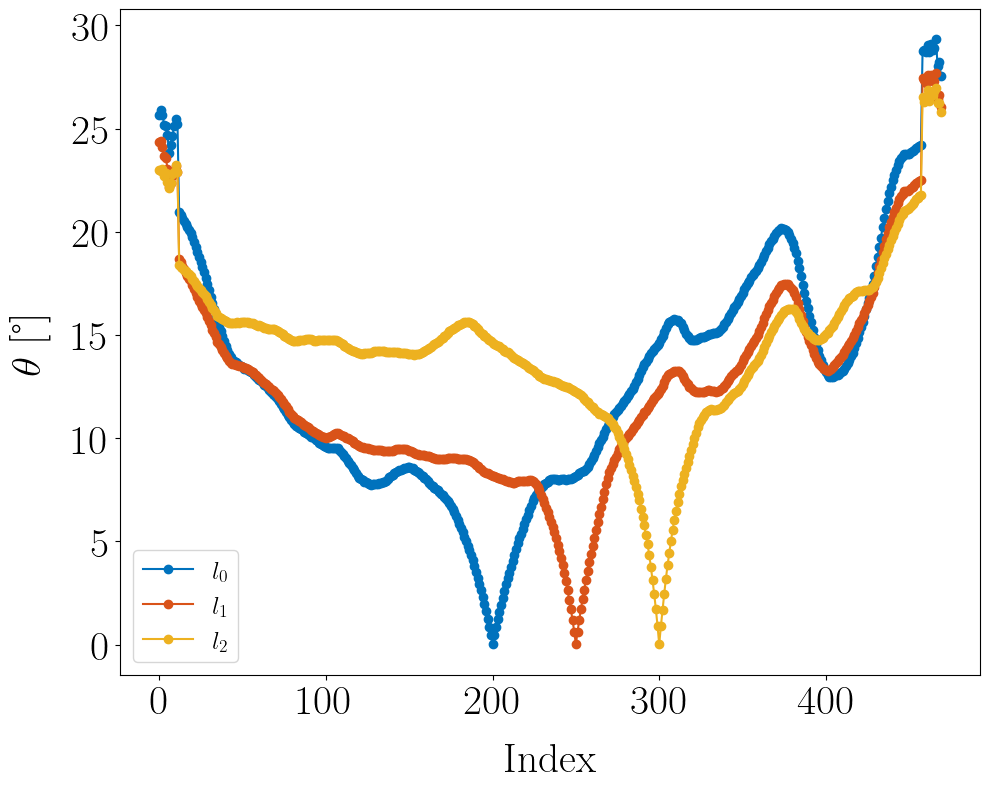

In [134]:
plt.figure()
for k, i_l in enumerate(i_ls):
    plt.plot(theta_mat_smooth[i_l, :], marker="o", color=color(k), label=rf"$l_{k}$")

plt.legend(fontsize=18)
plt.xlabel("Index")
plt.ylabel(r"$\theta$ [°]")
# plt.ylim([0, 20])
# plt.xlim([550, 750])

fpath = os.path.join(
    root_img,
    f"bootstrap_lib_win{rtf_mfp_processor.fsm_passive_analysis_segment_duration}s_overlap{rtf_mfp_processor.fsm_passive_analysis_segment_alpha_overlap}_zoomobs3_asymetry.png",
)
plt.savefig(fpath)

In [135]:
def plot_dist_ref_pos(ds_rtf, r_dist, dist):
    # Extract r around r_ref
    r = r_dist
    r_minus_rref = r - ds_rtf.r_ref
    dr_pos_idx = r_minus_rref >= 0
    r_pos = r[dr_pos_idx]

    # Plot module and phase at close pos
    for i, d_type in enumerate(dist.keys()):

        # theta_thresholds = [20, 30, 40]
        # Get dist
        d = dist[d_type]["d"]
        d_name = dist[d_type]["name"]
        d_unit = dist[d_type]["unit"]

        if d_unit == "-":
            d_unit == ""

        # Define thresholds as Q1, Q2, Q3 quartiles
        d_th = [np.percentile(d, q=qi) for qi in [0.1, 1, 5]]

        d_r_pos = d[dr_pos_idx]

        lfig = LargeFigure(legend_fontsize=14, size=(16, 10))
        fig, axs = plt.subplots(nrows=2, ncols=1, sharex=False)
        ax1, ax2 = axs

        # At ref pos
        rtf_mod_at_th_pos = ds_rtf.module.sel(h_index=2).sel(
            r=ds_rtf.r_ref, method="nearest"
        )
        rtf_mod_at_th_pos.plot(ax=ax2, label=f"Ref (Original)", color="k", linestyle="--")

        rtf_mod_at_th_pos = np.abs(ds_rtf.data.sel(h_index=2).sel(
            r=ds_rtf.r_ref, method="nearest"
        ))
        rtf_mod_at_th_pos.plot(ax=ax2, label=f"Ref", color="k")

        # rtf_phase_at_th_pos = ds_rtf.phase.sel(h_index=2).sel(
        #     r=ds_rtf.r_ref, method="nearest"
        # )
        # rtf_phase_at_th_pos.plot(ax=ax3, label=f"Ref", color="k")

        ax1.plot(r, d, color="k")
        ax1.set_ylabel(d_name + f" {d_unit}")

        for i, th in enumerate(d_th):
            idx = np.where(d_r_pos >= th)[0][0]
            r_th = r_pos[idx]

            rtf_mod_at_th_pos = np.abs(ds_rtf.data.sel(h_index=2).sel(
                r=r_th, method="nearest"
            ))
            # rtf_mod_at_th_pos = 10 * np.log10(rtf_mod_at_th_pos)
            rtf_mod_at_th_pos.plot(
                ax=ax2, label=f"r = {rtf_mod_at_th_pos.r.values:.1f}m", color=color(i)
            )

            # rtf_phase_at_th_pos = ds_rtf.phase.sel(h_index=2).sel(
            #     r=r_th, method="nearest"
            # )
            # rtf_phase_at_th_pos.plot(
            #     ax=ax3, label=f"r = {rtf_mod_at_th_pos.r.values:.1f}m", color=color(i)
            # )

            label = (
                d_name
                + f" = {th:.1f}{d_unit[1]} (r = {rtf_mod_at_th_pos.r.values:.1f}m)"
            )
            ax1.scatter(
                r_th,
                d_r_pos[idx],
                color=color(i),
                label=label,
                # label=r"$\theta$ = "
                # + str(th)
                # + f"° (r = {rtf_mod_at_th_pos.r.values:.1f}m)",
            )

        ax2.set_yscale("log")
        ax2.set_ylabel(r"$\lvert \Pi \rvert $")

        # ax3.set_ylabel(r"$\Phi$")

        ax1.set_title("")
        ax2.set_title("")
        # ax3.set_title("")
        ax1.legend()
        ax2.legend()
        # ax3.legend()

        # fname = f"rtf_at_selected_pos_{d_type}.png"
        # fpath = os.path.join(root_fig, fname)
        # plt.savefig(fpath)
        # plt.close("all")

In [136]:
# # Filter dist to avoid start and end

# # Remove first and last points out of windows
# I_q_center_first = 0 * n_overlap_I + P  # P = n_I // 2
# I_q_center_last = (Q-1) * n_overlap_I + P  # P = n_I // 2
# # print(I_q_center_first, I_q_center_last)

# # Warning : there is a strange behavior with dict of dict
# # The length of each item is being modified
# # We should fix this correclty, for now we just recompute dist each time to avoid any isssues
# dist1 = get_dist(ds, distances=distances)
# dist2 = get_dist(ds_smooth, distances=distances),     -> FIXED with deepcopy

# d1 = dist1["hermitian_angle"]["d"][I_q_center_first : I_q_center_last + 1]
# d2 = dist2["hermitian_angle"]["d"][I_q_center_first : I_q_center_last + 1]
# r_valid = ds.r.values[I_q_center_first : I_q_center_last + 1]

# print(d1.shape)
# print(d2.shape)
# import copy 
# # dist1_crop = dist1.copy()
# dist1_crop = copy.deepcopy(dist1)
# dist1_crop["hermitian_angle"]["d"] = d1
# # dist2_crop = dist2.copy()
# dist2_crop = copy.deepcopy(dist2)
# dist2_crop["hermitian_angle"]["d"] = d2

NameError: name 'dist1' is not defined

In [138]:
# plot_dist_ref_pos(ds, r_valid, dist1_crop)
# plot_dist_ref_pos(ds_smooth, r_valid, dist2_crop)

NameError: name 'r_valid' is not defined

In [ ]:
# before_smooth = 10 * np.log10(np.abs(ds.data.sel(h_index=2)))
# after_smooth = 10 * np.log10(np.abs(ds_smooth.data.sel(h_index=2)))

# sel_ranges = [ds.r_ref, ds.r_ref+10, ds.r_ref+20, ds.r_ref+30]
# for i_rs, rs in enumerate(sel_ranges):
#     before_smooth_rs = before_smooth.sel(r=rs, method="nearest")
#     after_smooth_rs = after_smooth.sel(r=rs, method="nearest")

#     plt.figure()
#     before_smooth_rs.plot(x="f", label=f"Original (r = {before_smooth_rs.r.values:.2f}m)")
#     after_smooth_rs.plot(x="f", label=f"Smooth (r = {after_smooth_rs.r.values:.2f}m)")
#     # plt.xscale("log")
#     plt.legend()